In [104]:
#Working on data in which the sentences have been split into subsentences and provided with annotations manually. 

#Note: The complete data is not used(Ambiguous sentences are left out) 

In [38]:
import pandas as pd

data = pd.read_excel('FinalST1.xlsx')

In [39]:
data.head()

,RID,SID,text,polarity,category,target,entity,attribute
0,1004293,1004293:0,Judging from previous posts this used to be a ...,negative,RESTAURANT#GENERAL,place,RESTAURANT,GENERAL
1,1004293,1004293:1,We there were four of us arrived at noon the p...,negative,SERVICE#GENERAL,staff,SERVICE,GENERAL
2,1004293,1004293:2,They never brought us complimentary noodles ig...,negative,SERVICE#GENERAL,NaN,SERVICE,GENERAL
3,1004293,1004293:4,After all that they complained to me about the...,negative,SERVICE#GENERAL,NaN,SERVICE,GENERAL
4,1004293,1004293:5,Avoid this place,negative,RESTAURANT#GENERAL,place,RESTAURANT,GENERAL


In [40]:
#Sentence tokenization

import nltk

sent_tokens = data.apply(lambda row: nltk.sent_tokenize(row["text"]), axis=1)

sent_tokens

0       [Judging from previous posts this used to be a...
1       [We there were four of us arrived at noon the ...
2       [They never brought us complimentary noodles i...
3       [After all that they complained to me about th...
4                                      [Avoid this place]
5       [I have eaten at Saul many times the food is a...
6       [Saul is the best restaurant on Smith Street a...
7          [I was very disappointed with this restaurant]
8       [Ive asked a cart attendant for a lotus leaf w...
9       [I had to ask her three times before she final...
10                          [Food was okay nothing great]
11           [Iwe will never go back to this place again]
12      [Went on a 3 day oyster binge with Fish bringi...
13                               [You cant go wrong here]
14      [Every time in New York I make it a point to v...
15      [I had the duck breast special on my last visi...
16                     [Cant wait wait for my next visit]
17      [And I

In [41]:
len(sent_tokens)

1502

In [42]:
#Merging into a single document for data cleaning

import itertools

doc_complete = list(itertools.chain.from_iterable(list(sent_tokens)))

doc_complete

['Judging from previous posts this used to be a good place but not any longer',
 'We there were four of us arrived at noon the place was empty and the staff acted like we were imposing on them and they were very rude',
 'They never brought us complimentary noodles ignored repeated requests for sugar and threw our dishes on the table',
 'After all that they complained to me about the small tip',
 'Avoid this place',
 'I have eaten at Saul many times the food is always consistently outrageously good',
 'Saul is the best restaurant on Smith Street and in Brooklyn',
 'I was very disappointed with this restaurant',
 'Ive asked a cart attendant for a lotus leaf wrapped rice and she replied back rice and just walked away',
 'I had to ask her three times before she finally came back with the dish Ive requested',
 'Food was okay nothing great',
 'Iwe will never go back to this place again',
 'Went on a 3 day oyster binge with Fish bringing up the closing and I am so glad this was the place it O

In [43]:
#Cleaning data

import string
from nltk.stem import WordNetLemmatizer 
import gensim
from nltk.stem import PorterStemmer 
from nltk.tokenize import word_tokenize 
   
ps = PorterStemmer() 
lemmatizer = WordNetLemmatizer()

stop = ['i','me','my','myself','we','our','ours','ourselves','you',"you're","you've","you'll","you'd",'your','yours',
         'yourself','yourselves','he','him','his','himself','she',"she's",'her','hers','herself','it',"it's",'its','itself',
         'they','the','them','their','theirs','themselves','what','which','who','whom','this','that',"that'll",'these',
         'those','am','is','are','was','were','be','been','being','have','has','had','having','do','does','did','doing',
         'a','an','the','and','but','if','or','because','as','until','while','of','at','by','for','with','about','against',
         'between','into','through','during','before','after','above','below','to','from','up','down','in','out','on','off',
         'over','under','again','further','then','once','here','there','when','where','why','how','all','any','both','each',
         'few','more','most','other','some','such','only','own','same','so','than','too','very','s','t','can','will','just',
         'don',"don't",'should',"should've",'now','d','ll','m','o','re','ve','y','ain','aren']

def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    lemmatized = ''.join(lemmatizer.lemmatize(word) for word in stop_free)
    stemmed = ''.join(ps.stem(lemma) for lemma in lemmatized)

    return stemmed

data_clean = [clean(doc).split() for doc in doc_complete]

In [44]:
data_clean

[['judging', 'previous', 'posts', 'used', 'good', 'place', 'not', 'longer'],
 ['four',
  'us',
  'arrived',
  'noon',
  'place',
  'empty',
  'staff',
  'acted',
  'like',
  'imposing',
  'rude'],
 ['never',
  'brought',
  'us',
  'complimentary',
  'noodles',
  'ignored',
  'repeated',
  'requests',
  'sugar',
  'threw',
  'dishes',
  'table'],
 ['complained', 'small', 'tip'],
 ['avoid', 'place'],
 ['eaten',
  'saul',
  'many',
  'times',
  'food',
  'always',
  'consistently',
  'outrageously',
  'good'],
 ['saul', 'best', 'restaurant', 'smith', 'street', 'brooklyn'],
 ['disappointed', 'restaurant'],
 ['ive',
  'asked',
  'cart',
  'attendant',
  'lotus',
  'leaf',
  'wrapped',
  'rice',
  'replied',
  'back',
  'rice',
  'walked',
  'away'],
 ['ask',
  'three',
  'times',
  'finally',
  'came',
  'back',
  'dish',
  'ive',
  'requested'],
 ['food', 'okay', 'nothing', 'great'],
 ['iwe', 'never', 'go', 'back', 'place'],
 ['went',
  '3',
  'day',
  'oyster',
  'binge',
  'fish',
  'bri

In [45]:
#Forming a list of terms(vocab)
import itertools

words = list(itertools.chain.from_iterable(data_clean))

#Finding POS

pos = nltk.pos_tag(words)

pos = dict(pos)

data_final=[]
sent = []

for sentence in data_clean:
    words=[]
    for term in sentence:
        #sent = sentence
        if pos[term] not in ['CC','DT','EX','IN','MD','PRP','PRP$','RP','TO','UH','WDT','WP','WRB']:
            words.append(term)
    data_final.append(words)

In [46]:
data_final

[['judging', 'previous', 'posts', 'used', 'good', 'place', 'not', 'longer'],
 ['four',
  'arrived',
  'noon',
  'place',
  'empty',
  'staff',
  'acted',
  'imposing',
  'rude'],
 ['never',
  'brought',
  'complimentary',
  'noodles',
  'ignored',
  'repeated',
  'requests',
  'sugar',
  'threw',
  'dishes',
  'table'],
 ['complained', 'small', 'tip'],
 ['avoid', 'place'],
 ['eaten',
  'saul',
  'many',
  'times',
  'food',
  'always',
  'consistently',
  'outrageously',
  'good'],
 ['saul', 'best', 'restaurant', 'smith', 'street', 'brooklyn'],
 ['disappointed', 'restaurant'],
 ['ive',
  'asked',
  'cart',
  'attendant',
  'lotus',
  'leaf',
  'wrapped',
  'rice',
  'replied',
  'back',
  'rice',
  'walked',
  'away'],
 ['ask',
  'three',
  'times',
  'finally',
  'came',
  'back',
  'dish',
  'ive',
  'requested'],
 ['food', 'nothing', 'great'],
 ['iwe', 'never', 'go', 'back', 'place'],
 ['went',
  '3',
  'day',
  'oyster',
  'binge',
  'fish',
  'bringing',
  'closing',
  'glad',
  '

In [47]:
len(data_final)

1502

In [48]:
count = 0
final_data = []
for l in data_final:
    if l:
        #print(data_final.index(l))
        final_data.append(l)
        count=count+1
    else:
        print(count)
        count=count+1
          

179
722
782


In [49]:
len(final_data)

1499

In [50]:
#Merging into a single document for data cleaning

import itertools

terms = list(itertools.chain.from_iterable(list(final_data)))

len(terms)


7870

In [51]:
terms_df = pd.DataFrame(terms,columns=["terms"])

In [52]:
len(pd.unique(terms_df.terms))

2383

In [53]:
#Implementing Word2Vec

from gensim import models
model_w2v = models.Word2Vec(final_data, size=300, window=5, min_count=1, workers=4)

In [54]:
#Vectors for all the words in the vocabulary

model_w2v.wv.vocab

{'judging': <gensim.models.keyedvectors.Vocab at 0x1d27572a080>,
 'previous': <gensim.models.keyedvectors.Vocab at 0x1d27572a358>,
 'posts': <gensim.models.keyedvectors.Vocab at 0x1d27572af28>,
 'used': <gensim.models.keyedvectors.Vocab at 0x1d27572a278>,
 'good': <gensim.models.keyedvectors.Vocab at 0x1d27572a470>,
 'place': <gensim.models.keyedvectors.Vocab at 0x1d27572a390>,
 'not': <gensim.models.keyedvectors.Vocab at 0x1d27572a5f8>,
 'longer': <gensim.models.keyedvectors.Vocab at 0x1d27572a908>,
 'four': <gensim.models.keyedvectors.Vocab at 0x1d27572a320>,
 'arrived': <gensim.models.keyedvectors.Vocab at 0x1d27572aa20>,
 'noon': <gensim.models.keyedvectors.Vocab at 0x1d27572ab00>,
 'empty': <gensim.models.keyedvectors.Vocab at 0x1d27572af98>,
 'staff': <gensim.models.keyedvectors.Vocab at 0x1d27572a588>,
 'acted': <gensim.models.keyedvectors.Vocab at 0x1d27572a048>,
 'imposing': <gensim.models.keyedvectors.Vocab at 0x1d27572aa58>,
 'rude': <gensim.models.keyedvectors.Vocab at 0x1d

In [55]:

#Number of vectors (equal to vocabulary size)

len(model_w2v.wv.vocab)

2383

In [56]:

#Printing list of words in the vocabulary..
words = list(model_w2v.wv.vocab)
print(words)


['judging', 'previous', 'posts', 'used', 'good', 'place', 'not', 'longer', 'four', 'arrived', 'noon', 'empty', 'staff', 'acted', 'imposing', 'rude', 'never', 'brought', 'complimentary', 'noodles', 'ignored', 'repeated', 'requests', 'sugar', 'threw', 'dishes', 'table', 'complained', 'small', 'tip', 'avoid', 'eaten', 'saul', 'many', 'times', 'food', 'always', 'consistently', 'outrageously', 'best', 'restaurant', 'smith', 'street', 'brooklyn', 'disappointed', 'ive', 'asked', 'cart', 'attendant', 'lotus', 'leaf', 'wrapped', 'rice', 'replied', 'back', 'walked', 'away', 'ask', 'three', 'finally', 'came', 'dish', 'requested', 'nothing', 'great', 'iwe', 'go', 'went', '3', 'day', 'oyster', 'binge', 'fish', 'bringing', 'closing', 'glad', 'trip', 'ended', 'cant', 'wrong', 'time', 'new', 'york', 'make', 'point', 'visit', 'duck', 'breast', 'special', 'last', 'incredible', 'wait', 'hate', 'say', 'doubt', 'ill', 'ever', 'thing', 'moderately', 'enjoyed', 'grilled', 'chicken', 'edamame', 'puree', '930'

In [57]:
model_w2v.most_similar('sushi')

C:\Users\BrontoByte\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('new', 0.24551761150360107),
 ('going', 0.2391507774591446),
 ('japanese', 0.2259906530380249),
 ('always', 0.2178574800491333),
 ('times', 0.21522092819213867),
 ('girlfriend', 0.20993396639823914),
 ('table', 0.20058470964431763),
 ('sense', 0.1993444561958313),
 ('take', 0.19725245237350464),
 ('eating', 0.19599439203739166)]

In [58]:
#Vector for the word sushi

model_w2v['sushi']

C:\Users\BrontoByte\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


array([ 8.55038990e-04,  5.75762184e-04,  8.80979991e-04,  1.87797938e-04,
        5.17203764e-04,  1.65230618e-03, -1.31610758e-03, -1.71013153e-03,
        8.77765822e-04, -1.61351240e-03, -8.63312569e-04,  1.04409782e-03,
        1.55953967e-04, -8.63862166e-04,  6.98522839e-04, -1.75079983e-03,
       -3.28750990e-04,  1.44910620e-04,  8.01800576e-04,  2.36040200e-04,
       -4.26792161e-04,  8.68113202e-05,  1.91506767e-03,  6.72489987e-04,
        1.19565055e-04,  7.06259103e-04,  8.84346839e-04, -2.14597862e-03,
       -5.07430523e-04,  1.56083901e-03, -8.05844378e-04,  6.68865105e-04,
        1.54691690e-03, -1.13993057e-03,  5.34302999e-05, -1.77318347e-03,
       -4.44291858e-04,  1.60667219e-03,  4.31917637e-04,  9.54547431e-04,
        1.17716426e-03,  1.30573113e-03,  1.26963574e-03,  2.15825508e-03,
       -7.78628048e-04, -1.47216010e-03, -1.55084810e-04, -1.46980293e-03,
       -1.30438898e-03, -8.80581327e-04,  8.46320530e-04, -1.12107873e-03,
        1.75989451e-04,  

In [59]:
set(model_w2v.wv.index2word)

{'owner',
 'enter',
 'rule',
 'several',
 'square',
 'elses',
 'busy',
 'expected',
 'blueberry',
 'citysearch',
 'undercooked',
 'differently',
 'extensive',
 'barts',
 'winner',
 'tasteless',
 'corona',
 'name',
 'cheeses',
 'cakes',
 'boyfriends',
 'al',
 'successfully',
 'fusion',
 'whos',
 'negative',
 'times',
 'id',
 'tilapia',
 'tomatoes',
 'convenient',
 'item',
 'huge',
 'credit',
 'maggot',
 'scheme',
 'aware',
 'sapphire',
 'meat',
 'buttery',
 'suggest',
 'onions',
 'share',
 'scale',
 'deal',
 'inventive',
 'fire',
 'ill',
 'messy',
 'gimmick',
 'quality',
 'chew',
 'duty',
 'dumping',
 'branzino',
 'target',
 'tupperware',
 'ragas',
 'slowwwww',
 'unassuming',
 'maine',
 'guilty',
 'def',
 'speaks',
 'alot',
 'best',
 'downside',
 'evaluated',
 'yesyou',
 'low',
 'smell',
 'cry',
 'stumbled',
 'grand',
 'thinking',
 'walk',
 'true',
 'boyfriend',
 'inexpensive',
 'portions',
 'overpack',
 'icecream',
 'introduced',
 'smoked',
 'quietly',
 'great',
 'lloovve',
 'pleased',

#### Averaging the Word2Vec Embeddings for each records

In [60]:
import numpy as np

num_features=300

def make_feature_vec(words, model, num_features):
    
    #Average the word vectors for a set of words
   
    feature_vec = np.zeros((num_features,),dtype="float32")  # pre-initialize (for speed)
    nwords = 0
    index2word_set = set(model.wv.index2word)  # words known to the model

    for word in words:
        if word in index2word_set: 
            nwords = nwords + 1
            feature_vec = np.add(feature_vec,model[word])
    
    feature_vec = np.divide(feature_vec, nwords)
    return feature_vec


def get_avg_feature_vecs(sentences, model, num_features):
   
    #Calculate average feature vectors for all reviews
   
    counter = 0
    mbti_feature_vecs = np.zeros((len(sentences),num_features), dtype='float32')  # pre-initialize (for speed)
    
    for sentence in sentences:
        mbti_feature_vecs[counter] = make_feature_vec(sentence, model, num_features)
        counter = counter + 1
    return mbti_feature_vecs

In [61]:
DataVecs = get_avg_feature_vecs(final_data, model_w2v, num_features)

C:\Users\BrontoByte\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  app.launch_new_instance()


In [62]:
len(DataVecs)

1499

In [63]:
final_data[24]

['ambiance', 'relaxed', 'stylish']

In [64]:
DataVecs[24]

array([ 1.35043089e-03, -2.84196140e-04, -4.21792211e-05,  3.34741693e-04,
       -1.05332595e-03,  1.34659073e-04, -1.03429484e-03, -9.71403846e-04,
        2.68632866e-04,  1.06275817e-04, -3.03443492e-04, -1.16695861e-04,
       -2.00275754e-04, -7.31119435e-05, -9.22461331e-04, -4.73541411e-04,
        4.72466229e-04, -2.45406845e-04,  1.21628214e-03, -6.33957796e-04,
        9.52398041e-05, -6.99602242e-04,  1.01016916e-03,  1.60005991e-04,
       -2.03695687e-04,  1.33198558e-03,  3.36244375e-05, -3.73163872e-04,
        6.18079910e-04, -6.32269832e-04, -8.00750277e-04,  4.62067110e-04,
        1.33105426e-03,  4.26575541e-04, -1.09458377e-03,  3.44582484e-04,
        9.43673600e-04,  1.12601696e-03,  5.16705157e-04,  5.19121997e-04,
       -1.02185295e-03, -5.56431012e-04, -7.02059187e-04,  5.66859788e-04,
       -1.15405582e-03, -6.34043186e-04,  3.11400654e-04, -2.15121927e-05,
       -2.74289196e-04, -7.80746981e-04,  2.80987791e-04,  4.60076932e-04,
       -7.64946963e-05, -

In [65]:
count = 0

for vec in DataVecs:
    if not np.any(np.isnan(vec)):
        count=count+1
    else:
        print(count)
        count=count+1

In [66]:
data["category"] = data["category"].astype('category')

data["category_cat"] = data["category"].cat.codes

data.head()

,RID,SID,text,polarity,category,target,entity,attribute,category_cat
0,1004293,1004293:0,Judging from previous posts this used to be a ...,negative,RESTAURANT#GENERAL,place,RESTAURANT,GENERAL,8
1,1004293,1004293:1,We there were four of us arrived at noon the p...,negative,SERVICE#GENERAL,staff,SERVICE,GENERAL,11
2,1004293,1004293:2,They never brought us complimentary noodles ig...,negative,SERVICE#GENERAL,NaN,SERVICE,GENERAL,11
3,1004293,1004293:4,After all that they complained to me about the...,negative,SERVICE#GENERAL,NaN,SERVICE,GENERAL,11
4,1004293,1004293:5,Avoid this place,negative,RESTAURANT#GENERAL,place,RESTAURANT,GENERAL,8


In [67]:
data["polarity"] = data["polarity"].astype('category')

data["polarity_cat"] = data["polarity"].cat.codes

data.head()

,RID,SID,text,polarity,category,target,entity,attribute,category_cat,polarity_cat
0,1004293,1004293:0,Judging from previous posts this used to be a ...,negative,RESTAURANT#GENERAL,place,RESTAURANT,GENERAL,8,0
1,1004293,1004293:1,We there were four of us arrived at noon the p...,negative,SERVICE#GENERAL,staff,SERVICE,GENERAL,11,0
2,1004293,1004293:2,They never brought us complimentary noodles ig...,negative,SERVICE#GENERAL,NaN,SERVICE,GENERAL,11,0
3,1004293,1004293:4,After all that they complained to me about the...,negative,SERVICE#GENERAL,NaN,SERVICE,GENERAL,11,0
4,1004293,1004293:5,Avoid this place,negative,RESTAURANT#GENERAL,place,RESTAURANT,GENERAL,8,0


In [68]:
data["category_cat"] = data["category_cat"].astype('category')

In [69]:
data["polarity_cat"] = data["polarity_cat"].astype('category')

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X_w2v = DataVecs
Y_polarity = data["polarity_cat"]

In [71]:
Y_polarity = Y_polarity.drop(Y_polarity.index[[179,722,782]])

In [73]:

#Y = mbti_preprocessed['I-E']
# split data into train and test sets
seed = 7
test_size = 0.33
X_train_w2v, X_test_w2v, y_train_polarity, y_test_polarity = train_test_split(X_w2v, Y_polarity, test_size=test_size, random_state=seed)


In [74]:
from sklearn import svm

svm_model = svm.SVC(kernel = 'linear',probability=True)

In [75]:

svm_model.fit(X_train_w2v,y_train_polarity)
svm_pred_w2v_polarity = svm_model.predict(X_test_w2v)
# evaluate predictions
svm_accuracy_w2v_polarity = accuracy_score(y_test_polarity, svm_pred_w2v_polarity)
print(svm_accuracy_w2v_polarity)

0.6505050505050505


C:\Users\BrontoByte\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_confusion_matrix is deprecated; This will be removed in v0.4.0. Please use scikitplot.metrics.plot_confusion_matrix instead.
  warnings.warn(msg, category=DeprecationWarning)


([<matplotlib.axis.YTick at 0x1d2785415f8>,
 <a list of 3 Text yticklabel objects>)

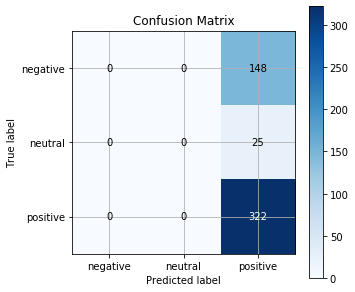

In [76]:
import scikitplot.plotters as skplt
import matplotlib.pyplot as plt
%matplotlib inline

skplt.plot_confusion_matrix(y_test_polarity, svm_pred_w2v_polarity,figsize=(5,5))

plt.xticks([0,1,2],['negative','neutral','positive'])
plt.yticks([0,1,2],['negative','neutral','positive'])

In [77]:
from sklearn.metrics import classification_report
print (classification_report(y_test_polarity, svm_pred_w2v_polarity))

             precision    recall  f1-score   support

          0       0.00      0.00      0.00       148
          1       0.00      0.00      0.00        25
          2       0.65      1.00      0.79       322

avg / total       0.42      0.65      0.51       495



C:\Users\BrontoByte\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [78]:
corpus = []
for doc in final_data:
    document = ' '.join(doc)
    corpus.append(document)
    document=[]

In [79]:
corpus

['judging previous posts used good place not longer',
 'four arrived noon place empty staff acted imposing rude',
 'never brought complimentary noodles ignored repeated requests sugar threw dishes table',
 'complained small tip',
 'avoid place',
 'eaten saul many times food always consistently outrageously good',
 'saul best restaurant smith street brooklyn',
 'disappointed restaurant',
 'ive asked cart attendant lotus leaf wrapped rice replied back rice walked away',
 'ask three times finally came back dish ive requested',
 'food nothing great',
 'iwe never go back place',
 'went 3 day oyster binge fish bringing closing glad place trip ended great',
 'cant go wrong',
 'time new york make point visit restaurant saul smith street',
 'duck breast special last visit incredible',
 'cant wait wait visit',
 'hate say doubt ill ever go back',
 'thing moderately enjoyed grilled chicken special edamame puree',
 'went 930 friday died bit service great',
 'love th pink pony',
 'perfect spot',
 'f

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X_predcat = vectorizer.fit_transform(corpus)
print(vectorizer.get_feature_names())
print(X_predcat.shape)


['10', '100', '1015', '10piece', '12', '126', '15', '17', '170', '1st', '20', '24', '33', '36', '40', '40000', '45', '45mins', '4th', '50', '500', '56', '57th', '58', '60', '6th', '930', '99', '9pm', 'aback', 'able', 'aboveaverage', 'abrupt', 'absolutely', 'accident', 'accidentally', 'accidently', 'accomodating', 'accompanied', 'accompaniment', 'acidity', 'acknowledgement', 'acknowledgment', 'act', 'acted', 'actually', 'ad', 'add', 'adequate', 'adjust', 'admitted', 'ads', 'advantage', 'advertise', 'advice', 'aesthetic', 'affordable', 'afternoon', 'aftertheatre', 'agenda', 'ago', 'agree', 'agreed', 'ahead', 'al', 'alice', 'aligned', 'alive', 'alla', 'allowed', 'allucaneat', 'almost', 'alone', 'alot', 'already', 'alright', 'also', 'always', 'amanzing', 'amazed', 'amazing', 'amazingly', 'ambiance', 'ambience', 'americaand', 'amex', 'amma', 'amused', 'angry', 'anniversary', 'answers', 'anybody', 'anyone', 'anything', 'anytime', 'anywhere', 'apart', 'apologize', 'apologized', 'apology', 'ap

In [81]:
Y_predcat = data['category_cat']

In [82]:
Y_predcat = Y_predcat.drop(Y_predcat.index[[179,722,782]])

In [83]:
#Y = mbti_preprocessed['I-E']
# split data into train and test sets
seed = 7
test_size = 0.33
X_train, X_test, y_train, y_test = train_test_split(X_predcat, Y_predcat, test_size=test_size, random_state=seed)

from sklearn import svm

model = svm.SVC(kernel = 'linear',probability=True)
model.fit(X_train,y_train)
svm_pred = model.predict(X_test)
# evaluate predictions
accuracy = accuracy_score(y_test, svm_pred)
print(accuracy)

0.6161616161616161


In [84]:
from sklearn.metrics import classification_report
print (classification_report(y_test, svm_pred))

             precision    recall  f1-score   support

          0       0.62      0.27      0.38        37
          1       1.00      0.33      0.50         3
          2       0.00      0.00      0.00         8
          3       0.60      0.60      0.60         5
          4       0.40      0.22      0.29         9
          5       0.61      0.89      0.73       146
          6       0.80      0.22      0.35        18
          7       0.00      0.00      0.00         4
          8       0.54      0.74      0.63       121
          9       0.00      0.00      0.00        35
         10       0.50      0.25      0.33        12
         11       0.79      0.64      0.71        97

avg / total       0.58      0.62      0.57       495



C:\Users\BrontoByte\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


C:\Users\BrontoByte\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_confusion_matrix is deprecated; This will be removed in v0.4.0. Please use scikitplot.metrics.plot_confusion_matrix instead.
  warnings.warn(msg, category=DeprecationWarning)


([<matplotlib.axis.YTick at 0x1d278699630>,
 <a list of 12 Text yticklabel objects>)

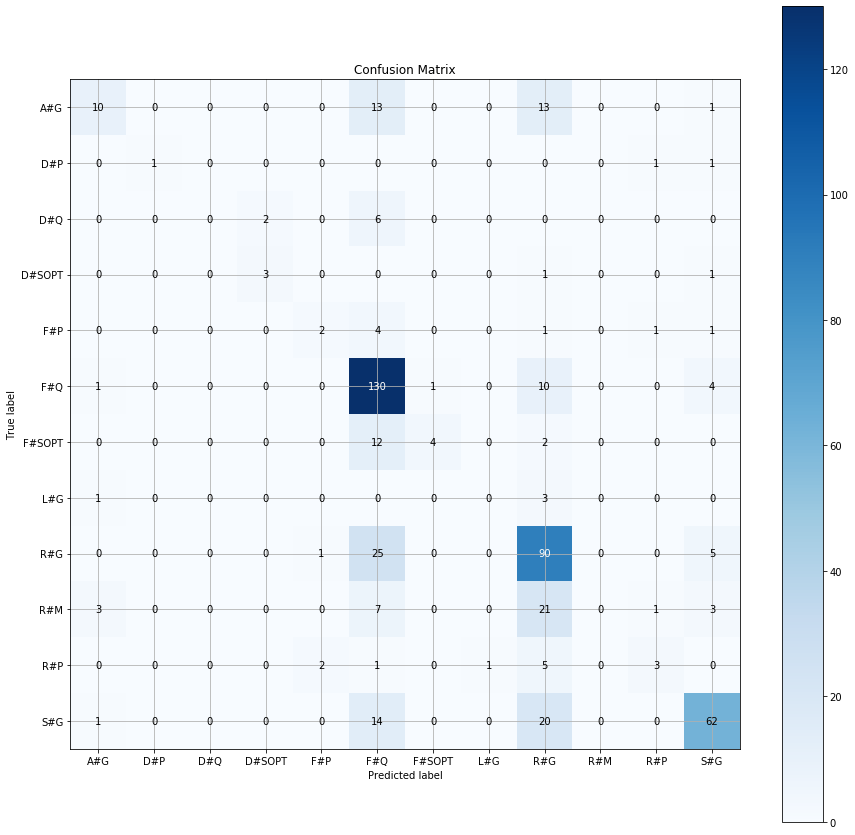

In [85]:
skplt.plot_confusion_matrix(y_test, svm_pred,figsize=(15,15))

plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],['A#G','D#P','D#Q','D#SOPT','F#P','F#Q','F#SOPT','L#G','R#G','R#M','R#P','S#G'])
plt.yticks([0,1,2,3,4,5,6,7,8,9,10,11],['A#G','D#P','D#Q','D#SOPT','F#P','F#Q','F#SOPT','L#G','R#G','R#M','R#P','S#G'])

In [90]:
#Model building for Polarity Prediction using TF-IDF

svm_model.fit(X_train,y_train_polarity)
svm_pred_polarity = svm_model.predict(X_test)
# evaluate predictions
svm_accuracy_polarity = accuracy_score(y_test_polarity, svm_pred_polarity)
print(svm_accuracy_polarity)

0.7575757575757576


C:\Users\BrontoByte\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_confusion_matrix is deprecated; This will be removed in v0.4.0. Please use scikitplot.metrics.plot_confusion_matrix instead.
  warnings.warn(msg, category=DeprecationWarning)


([<matplotlib.axis.YTick at 0x1d2788e9240>,
 <a list of 3 Text yticklabel objects>)

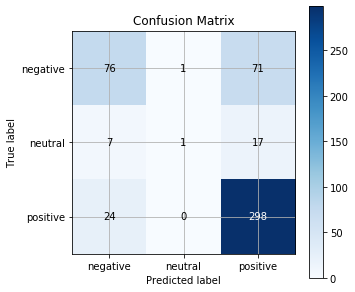

In [91]:
import scikitplot.plotters as skplt
import matplotlib.pyplot as plt
%matplotlib inline

skplt.plot_confusion_matrix(y_test_polarity, svm_pred_polarity,figsize=(5,5))

plt.xticks([0,1,2],['negative','neutral','positive'])
plt.yticks([0,1,2],['negative','neutral','positive'])


In [92]:
from sklearn.metrics import classification_report
print (classification_report(y_test_polarity, svm_pred_polarity))

             precision    recall  f1-score   support

          0       0.71      0.51      0.60       148
          1       0.50      0.04      0.07        25
          2       0.77      0.93      0.84       322

avg / total       0.74      0.76      0.73       495



### Using LIME to Understand the Predictions

In [93]:
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

class_names=['negative','neutral','positive']

c_tf = make_pipeline(vectorizer, svm_model)
explainer_tf = LimeTextExplainer(class_names=class_names)

In [94]:
sentence = 'the salads are delicious both refreshing and very spicy'
exp = explainer_tf.explain_instance(sentence, c_tf.predict_proba, num_features=2, top_labels=3,labels=(0,1,2))


C:\Users\BrontoByte\Anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


In [95]:
exp.show_in_notebook(text=sentence)


In [98]:
import itertools

def analyse(sentence):
    #sentence = removeNonAscii(sentence)
    subsentences = find_subsentences(sentence)
    for subsentence in subsentences:
        if subsentence:
#             subsentence.split(' ')
            
            tf_new = TfidfVectorizer(vocabulary=vectorizer.vocabulary_)
            vec = tf_new.fit_transform([subsentence])
            aspect_pred = model.predict(vec)
            polarity_pred = svm_model.predict(vec)
            print(subsentence)
            aspect_dict={'0':'AMBIENCE#GENERAL','1':'DRINKS#PRICES','2':'DRINKS#QUALITY','3':'DRINKS#STYLE_OPTIONS',
                         '4':'FOOD#PRICES','5':'FOOD#QUALITY','6':'FOOD#STYLE_OPTIONS','7':'LOCATION#GENERAL',
                         '8':'RESTAURANT#GENERAL','9':'RESTAURANT#MISCELLANEOUS','10':'RESTAURANT#PRICES','11':'SERVICE#GENERAL'}
            polarity_dict = {'0':'negative','1':'neutral','2':'positive'}
            
            print("Aspect Category: ",aspect_dict[str(aspect_pred[0])])
            print("Polarity:",polarity_dict[str(polarity_pred[0])])
            exp = explainer_tf.explain_instance(subsentence, c_tf.predict_proba, num_features=2, top_labels=1)

            exp.show_in_notebook(text=subsentence)
    

In [99]:
text_sentence = 'food was good and service was bad'
analyse(text_sentence)

food was good
Aspect Category:  FOOD#QUALITY
Polarity: positive


C:\Users\BrontoByte\Anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


service was bad
Aspect Category:  SERVICE#GENERAL
Polarity: negative


In [100]:
text_sentence2 = 'The duck confit is always amazing and the foie gras terrine with figs was out of this world'

analyse(text_sentence2)

The duck confit is always amazing
Aspect Category:  FOOD#QUALITY
Polarity: positive


C:\Users\BrontoByte\Anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


the foie gras terrine with figs was out of this world
Aspect Category:  FOOD#QUALITY
Polarity: positive


In [101]:
text_sentence3 = 'Food is great and inexpensive'
analyse(text_sentence3)

Food is great and inexpensive
Aspect Category:  FOOD#QUALITY
Polarity: positive


C:\Users\BrontoByte\Anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


In [102]:
text_sentence4 = "I like the somosas, chai, and the chole, but the dhosas and dhal were kinda dissapointing."
analyse(text_sentence4)

I like the somosas , chai , and the chole
Aspect Category:  FOOD#QUALITY
Polarity: positive


C:\Users\BrontoByte\Anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


the dhosas and dhal were kinda dissapointing
Aspect Category:  FOOD#QUALITY
Polarity: negative


In [103]:
text_sentence5 = "The wine list is interesting and has many good values"
analyse(text_sentence5)

The wine list is interesting and has many good values
Aspect Category:  DRINKS#STYLE_OPTIONS
Polarity: positive


C:\Users\BrontoByte\Anaconda3\lib\re.py:212: FutureWarning: split() requires a non-empty pattern match.
  return _compile(pattern, flags).split(string, maxsplit)


In [1]:
import os
java_path = r'C:/Program Files/Java/jdk1.8.0_201/bin/java.exe'
os.environ['JAVAHOME'] = java_path

from nltk.parse.stanford import StanfordParser

scp = StanfordParser(path_to_jar='F:/Monica/stanford-parser-full-2015-04-20/stanford-parser-full-2015-04-20/stanford-parser.jar',
                     path_to_models_jar='F:/Monica/stanford-parser-full-2015-04-20/stanford-parser-full-2015-04-20/stanford-parser-3.5.2-models.jar')


C:\Users\BrontoByte\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: The StanfordParser will be deprecated
Please use nltk.parse.corenlp.StanforCoreNLPParser instead.
  


In [2]:
##Final function

#sentence2 = "I like the somosas, chai, and the chole, but the dhosas and dhal were kinda dissapointing."
def find_subsentences(sentence):
    result = list(scp.raw_parse(sentence))

    l = []
    for node in result[0]:
        for subtree in node.subtrees():
            if subtree.label() == 'S':
                subsent = " ".join(subtree.leaves())
                l.append(subsent)

    subtexts = l

    #presubtexts = subtexts[:]       # ADDED IN EDIT for leftover check

    if(len(subtexts)>1):
        for i in reversed(range(len(subtexts))):
            try:
                subtexts[i] = subtexts[i][0:subtexts[i].index(subtexts[i+1])]
                #print(subtexts[i])
            except:
                subtexts[i]=l[i]
    #             print('except',subtexts[i])
    #             print('l:',l[i])
    else:
        return subtexts

    return subtexts

In [3]:
sentence = 'sometimes i get bad food and bad service sometimes i get good food and bad service'
find_subsentences(sentence)

['get ', 'bad food and bad service sometimes i get good food and bad service']

In [393]:
def removeNonAscii(s): return "".join(filter(lambda x: ord(x)<128, s))

In [ ]:
subsent_list = []

for sent in cleanuniqueduptext:
    a = find_subsentences(sent)
    subsent_list.append(a)